## Data processing (step 2 - elimination of correlation, part 1)

In [968]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [453]:
pd.options.mode.chained_assignment = None

In [897]:
df = pd.read_csv('sample.csv', sep=';')
df

,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,...,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
0,43.00,27.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,9,4,0,13,22,1,0,52,4,5850000.00
1,34.00,19.0,3.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,15,3,0,15,29,1,10,66,14,6000000.00
2,43.00,29.0,2.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,10,3,0,11,27,0,4,67,10,5700000.00
3,89.00,50.0,9.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,11,2,1,4,4,0,0,26,3,13100000.00
4,77.00,77.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,319,108,17,135,236,2,91,195,14,16331452.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,52.20,31.8,10.0,12.0,5.0,1973.0,2.0,9.1,2.0,Investment,...,28,1,1,8,39,2,3,75,12,7118500.41
38129,54.09,30.0,14.0,0.0,1.0,1980.0,2.0,0.0,2.0,OwnerOccupier,...,2,1,0,0,10,0,0,0,0,7118500.41
38130,41.08,1.0,12.0,1.0,1.0,1.0,1.0,1.0,1.0,OwnerOccupier,...,371,141,26,150,249,2,105,203,13,7118500.41
38131,34.80,19.8,8.0,9.0,5.0,1977.0,1.0,6.4,2.0,Investment,...,7,2,0,5,11,0,2,43,10,7118500.41


In [455]:
def choose_columns_with_high_corr(corr_matrix, r):
    high_corr_cols = {}
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > r:
                colnames = tuple([corr_matrix.columns[i], corr_matrix.columns[j]])
                high_corr_cols[colnames] = corr_matrix.iloc[i, j]
    return high_corr_cols

## Explore age correlation

In [898]:
age_columns = [ 
                '0_6_male', 
                '0_6_female',
                '0_6_all',  
                '7_14_all', 
                '7_14_female',
                '7_14_male',  
                '16_29_all', 
                '16_29_female',
                '16_29_male',
                '0_17_all', 
                '0_17_male', 
                '0_17_female', 
                '0_13_female',
                '0_13_all', 
                '0_13_male',
                'ekder_male', 
                'ekder_female',
                'ekder_all',
                'young_male', 
                'young_female',
                'young_all', 
                'work_male',
                'work_female',
                'work_all', 
                "male_f",
                "female_f", 
                "full_all", 
                'raion_popul', 
                'children_school'
]

In [899]:
ages = df[age_columns]
ages

,0_6_male,0_6_female,0_6_all,7_14_all,7_14_female,7_14_male,16_29_all,16_29_female,16_29_male,0_17_all,...,young_female,young_all,work_male,work_female,work_all,male_f,female_f,full_all,raion_popul,children_school
0,4899,4677,9576,10309,4846,5463,17508,8083,9425,23603,...,10147,21154,52277,45930,98207,40477,45729,86206,155572,10309
1,3466,3414,6880,7759,3850,3909,15164,7593,7571,17700,...,7802,15727,35622,34572,70194,34200,42084,76284,115352,7759
2,3095,2784,5879,6207,2938,3269,19401,10356,9045,14884,...,6193,13028,31813,31575,63388,46076,55906,101982,101708,6207
3,6645,6442,13087,13670,6544,7126,3292,1842,1450,32063,...,13883,28563,60040,60341,120381,9828,11327,21155,178473,13670
4,2982,2724,5706,6748,3084,3664,5164,2581,2583,15237,...,6209,13368,34236,33807,68043,13522,14657,28179,108171,6748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,4062,3455,7517,7960,3680,4280,24753,11748,13005,19439,...,7617,16468,55456,44606,100062,58226,64774,123000,153248,7960
38129,495,459,953,915,444,472,4923,2169,2754,2243,...,962,1991,4707,4203,8910,10343,11477,21819,13890,915
38130,2079,2158,4237,6398,3304,3094,23480,11989,11491,12508,...,5802,11272,21901,22020,43921,52836,63906,116742,75377,6398
38131,2876,2718,5594,7227,3509,3718,28334,16660,11674,14976,...,6597,13595,50319,54316,104635,55959,73248,129207,145576,7227


In [413]:
print(f"Differences", "{:.2f}%".format(ages[(ages['male_f'] + ages['female_f']) != ages['full_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 17.79%


In [414]:
print(f"Differences", "{:.2f}%".format(ages[(ages['0_6_male'] + ages['0_6_female']) != ages['0_6_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 13.01%


In [415]:
print(f"Differences", "{:.2f}%".format(ages[(ages['7_14_male'] + ages['7_14_female']) != ages['7_14_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 13.99%


In [416]:
print(f"Differences", "{:.2f}%".format(ages[(ages['16_29_male'] + ages['16_29_female']) != ages['16_29_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 11.93%


In [417]:
print(f"Differences", "{:.2f}%".format(ages[(ages['0_17_male'] + ages['0_17_female']) != ages['0_17_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 15.61%


In [418]:
print(f"Differences", "{:.2f}%".format(ages[(ages['0_13_male'] + ages['0_13_female']) != ages['0_13_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 0.95%


In [419]:
print(f"Differences", "{:.2f}%".format(ages[(ages['young_male'] + ages['young_female']) != ages['young_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 5.45%


In [420]:
print(f"Differences", "{:.2f}%".format(ages[(ages['work_male'] + ages['work_female']) != ages['work_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 9.11%


In [421]:
print(f"Differences", "{:.2f}%".format(ages[(ages['ekder_male'] + ages['ekder_female']) != ages['ekder_all']].shape[0] / 
                                      ages.shape[0] * 100))

Differences 7.30%


<AxesSubplot:>

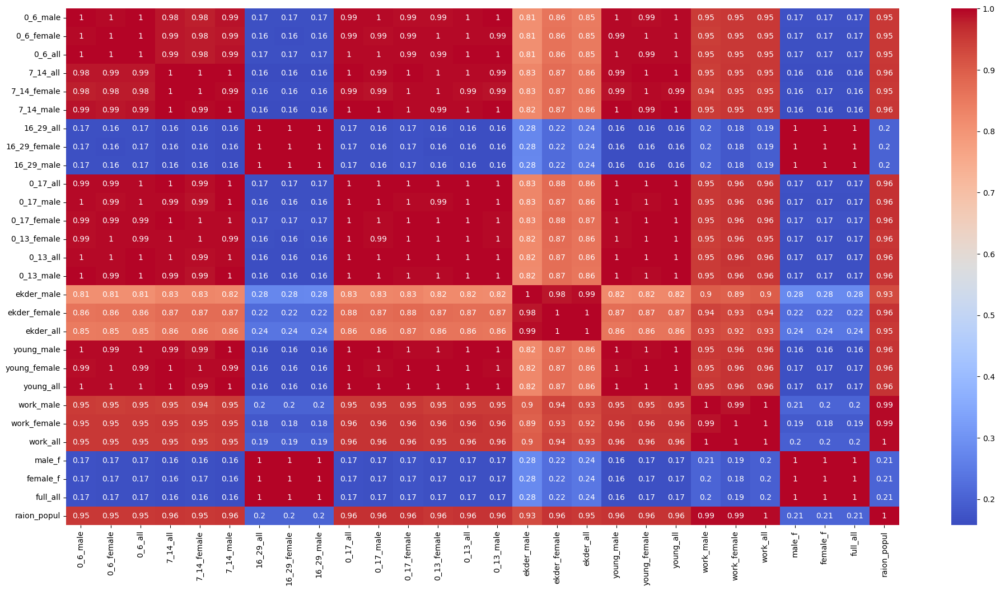

In [371]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

Check idea: male_f / full_all , female_f / full_all => less corr

In [372]:
ages['male_f'] = ages['male_f'] / ages['full_all']
ages['female_f'] = ages['female_f'] / ages['full_all']

In [373]:
test = ages.drop('full_all', axis=1)

<AxesSubplot:>

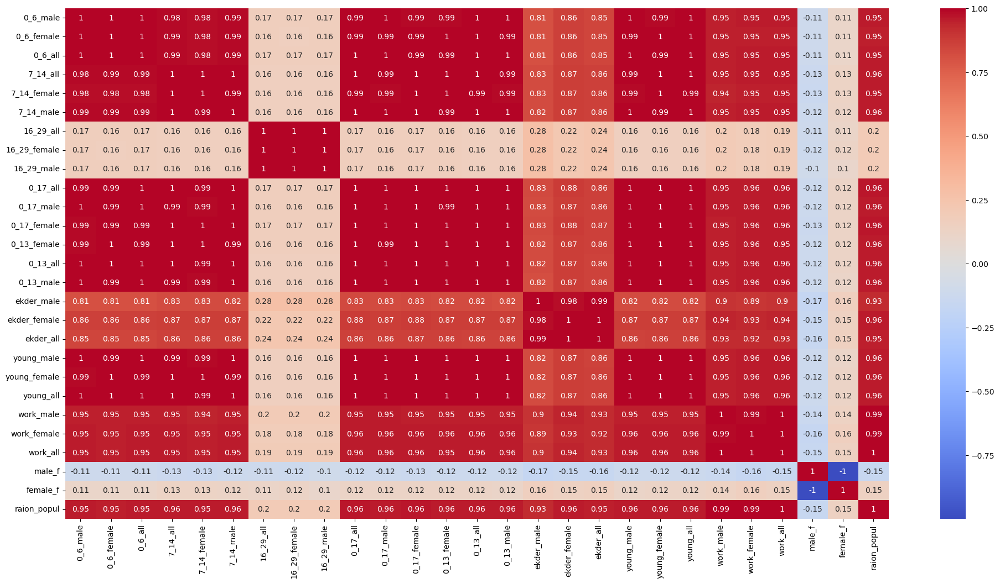

In [374]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(test.corr(), annot=True, cmap='coolwarm')

In [900]:
def manipulate_columns(ages):
    columns_all = ages.columns[ages.columns.str.contains(".*_all")]
    for column in columns_all:
        first_part_column = column.split('_all')[0]
        female_column = '_'.join([first_part_column, 'female'])
        male_column = '_'.join([first_part_column, 'male'])
        
        if 'full' in first_part_column:
            female_column = '_'.join(['female', first_part_column[0]])
            male_column = '_'.join(['male', first_part_column[0]]) 
        

        ages[female_column] = ages[female_column] / ages[column]
        ages[male_column] = ages[male_column] / ages[column]
        ages.drop(column, axis=1,inplace=True) 

In [901]:
manipulate_columns(ages)

<AxesSubplot:>

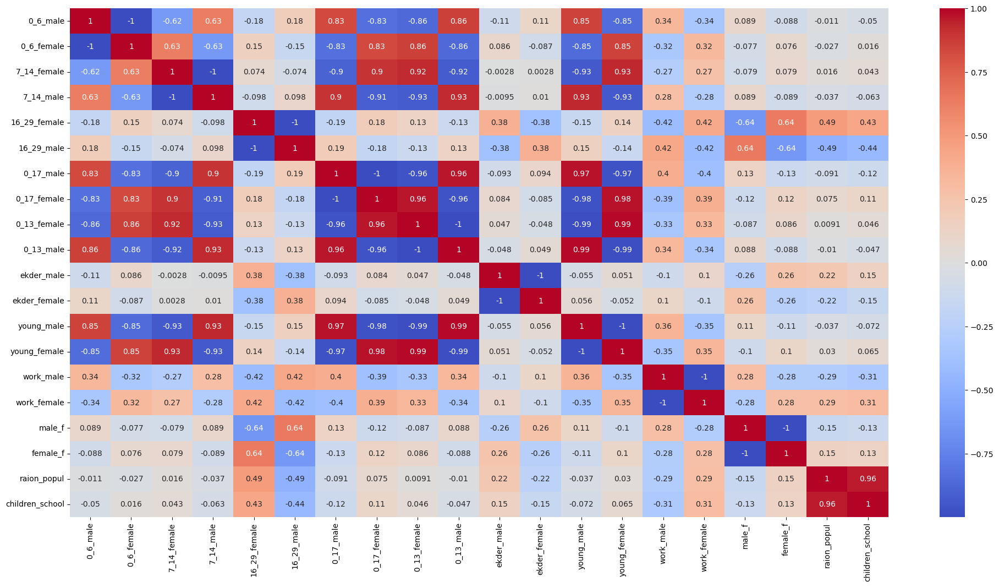

In [902]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

candites to drop:

0_13
0_17
young

In [378]:
drop_columns = ages.columns[ages.columns.str.contains('(0_13|0_17|young)')]

C:\Users\User\AppData\Local\Temp\ipykernel_13260\55382034.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_columns = ages.columns[ages.columns.str.contains('(0_13|0_17|young)')]


In [379]:
ages.drop(columns=drop_columns, axis=1, inplace=True)

<AxesSubplot:>

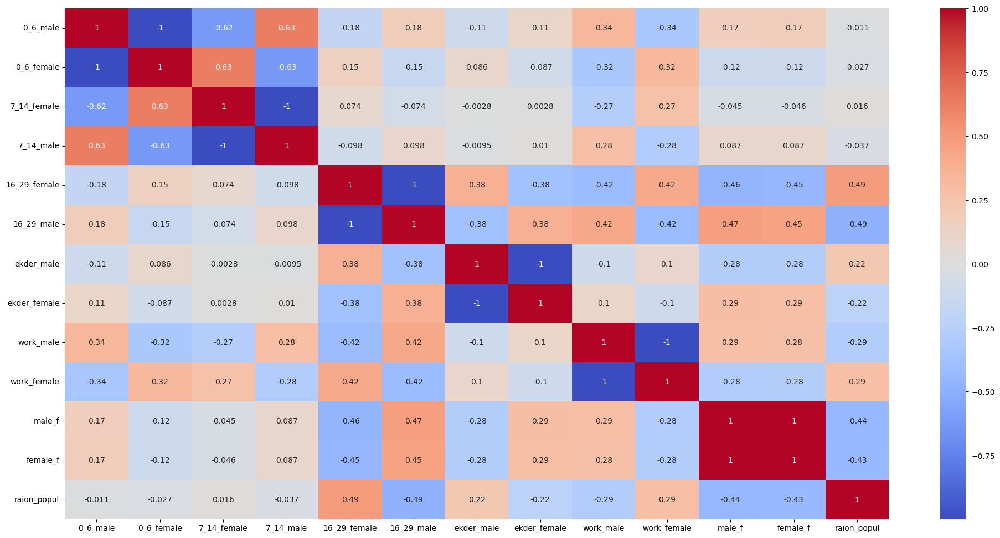

In [380]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

Exploration shows: 

1) don't watch on difference in gender

2) drop columns:  0_13, 0_17, young


In [903]:
ages = df[age_columns]

In [904]:
gender_columns = list(ages.columns[ages.columns.str.contains(".*_(female|male)")])
young_columns = list(ages.columns[ages.columns.str.contains('(0_13|0_17|young)_')])

C:\Users\User\AppData\Local\Temp\ipykernel_13260\2369268070.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  gender_columns = list(ages.columns[ages.columns.str.contains(".*_(female|male)")])
C:\Users\User\AppData\Local\Temp\ipykernel_13260\2369268070.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  young_columns = list(ages.columns[ages.columns.str.contains('(0_13|0_17|young)_')])


In [905]:
drop_columns = gender_columns + young_columns + ['male_f', 'female_f']
drop_columns

['0_6_male',
 '0_6_female',
 '7_14_female',
 '7_14_male',
 '16_29_female',
 '16_29_male',
 '0_17_male',
 '0_17_female',
 '0_13_female',
 '0_13_male',
 'ekder_male',
 'ekder_female',
 'young_male',
 'young_female',
 'work_male',
 'work_female',
 '0_17_all',
 '0_17_male',
 '0_17_female',
 '0_13_female',
 '0_13_all',
 '0_13_male',
 'young_male',
 'young_female',
 'young_all',
 'male_f',
 'female_f']

In [906]:
ages.drop(columns=drop_columns, axis=1, inplace=True)

<AxesSubplot:>

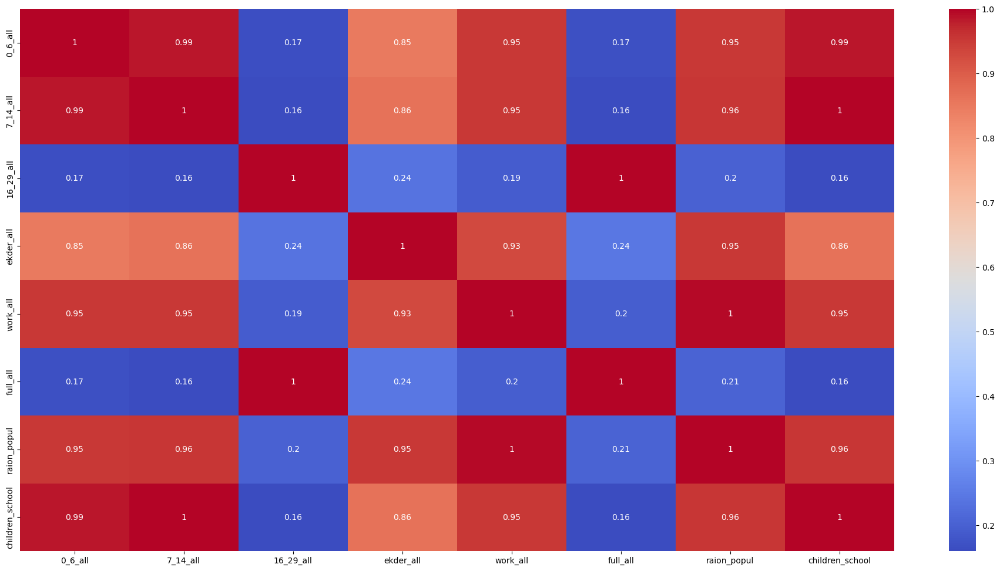

In [907]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

Not good attempt 

In [908]:
ages

,0_6_all,7_14_all,16_29_all,ekder_all,work_all,full_all,raion_popul,children_school
0,9576,10309,17508,36211,98207,86206,155572,10309
1,6880,7759,15164,29431,70194,76284,115352,7759
2,5879,6207,19401,25292,63388,101982,101708,6207
3,13087,13670,3292,29529,120381,21155,178473,13670
4,5706,6748,5164,26760,68043,28179,108171,6748
...,...,...,...,...,...,...,...,...
38128,7517,7960,24753,36718,100062,123000,153248,7960
38129,953,915,4923,2989,8910,21819,13890,915
38130,4237,6398,23480,20184,43921,116742,75377,6398
38131,5594,7227,28334,27346,104635,129207,145576,7227


In [387]:
ages['0_6_all'] + ages['7_14_all'] + ages['16_29_all']

0        37393
1        29803
2        31487
3        30049
4        17618
         ...  
38128    40230
38129     6791
38130    34115
38131    41155
38132    39702
Length: 38133, dtype: int64

In [388]:
df['young_all'] + df['work_all'] + df['ekder_all']

0        155572
1        115352
2        101708
3        178473
4        108171
          ...  
38128    153248
38129     13890
38130     75377
38131    145576
38132    111874
Length: 38133, dtype: int64

In [389]:
df['raion_popul']

0        155572
1        115352
2        101708
3        178473
4        108171
          ...  
38128    153248
38129     13890
38130     75377
38131    145576
38132    111874
Name: raion_popul, Length: 38133, dtype: int64

In [390]:
df[df['young_all'] + df['work_all'] + df['ekder_all'] == df['raion_popul']].shape[0] == df['raion_popul'].shape[0]

True

In [391]:
ages['work_all'] = ages['work_all'] / df['raion_popul']
ages['ekder_all'] = ages['ekder_all'] / df['raion_popul']

<AxesSubplot:>

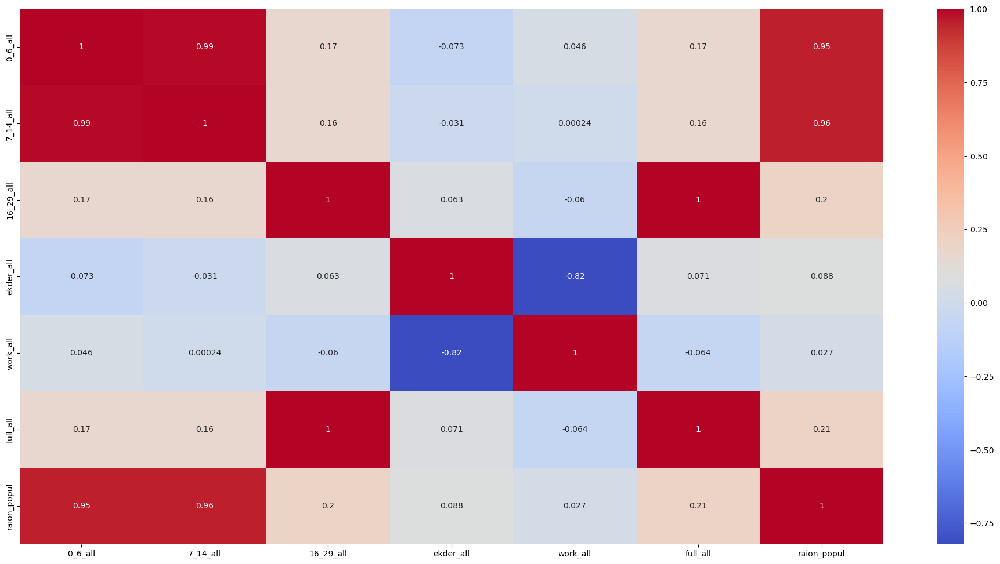

In [392]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

New idea: use young, work, ekder column / ratio_column
drop all age columns

In [916]:
ages = df[age_columns]

In [917]:
drop_columns = ages.columns[ages.columns.str.contains('(.*_.*_.*|.*_(female|male)|(female|male)_f)|full_.*')]
drop_columns

C:\Users\User\AppData\Local\Temp\ipykernel_13260\275720456.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_columns = ages.columns[ages.columns.str.contains('(.*_.*_.*|.*_(female|male)|(female|male)_f)|full_.*')]


Index(['0_6_male', '0_6_female', '0_6_all', '7_14_all', '7_14_female',
       '7_14_male', '16_29_all', '16_29_female', '16_29_male', '0_17_all',
       '0_17_male', '0_17_female', '0_13_female', '0_13_all', '0_13_male',
       'ekder_male', 'ekder_female', 'young_male', 'young_female', 'work_male',
       'work_female', 'male_f', 'female_f', 'full_all'],
      dtype='object')

In [918]:
ages.drop(columns=drop_columns, axis=1, inplace=True)

In [919]:
ages.columns

Index(['ekder_all', 'young_all', 'work_all', 'raion_popul', 'children_school'], dtype='object')

In [920]:
for column in ages.columns:
    if column not in ['raion_popul', 'children_school']:
        ages[column] /= ages['raion_popul']

In [921]:
ages.drop('raion_popul', axis=1, inplace=True)

<AxesSubplot:>

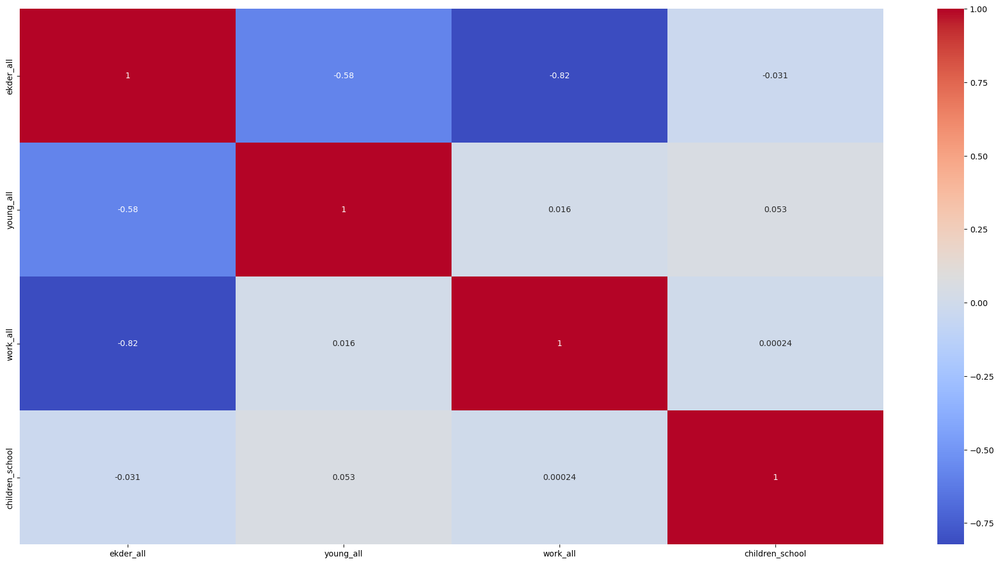

In [922]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

In [923]:
ages['children_preschool'] = df['children_preschool'] 

<AxesSubplot:>

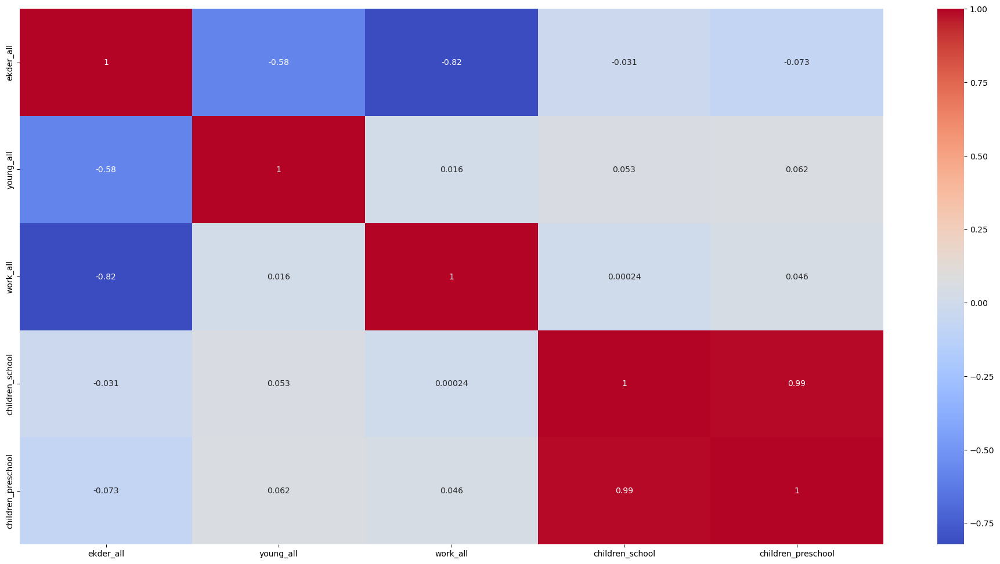

In [924]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

In [925]:
corr_matrix = df.corr()

In [926]:
df.columns[df.columns.str.contains('pre')]

Index(['children_preschool', 'preschool_quota',
       'preschool_education_centers_raion', 'preschool_km'],
      dtype='object')

In [927]:
corr_matrix['price_doc'][df.columns[df.columns.str.contains('school')]]

children_preschool                       0.120007
preschool_quota                         -0.048003
preschool_education_centers_raion        0.142716
children_school                          0.124555
school_quota                             0.008846
school_education_centers_raion           0.172852
school_education_centers_top_20_raion    0.091557
school_km                               -0.126526
preschool_km                            -0.124935
Name: price_doc, dtype: float64

Drop preschool values

In [928]:
ages.drop('children_preschool', axis=1,inplace=True)

<AxesSubplot:>

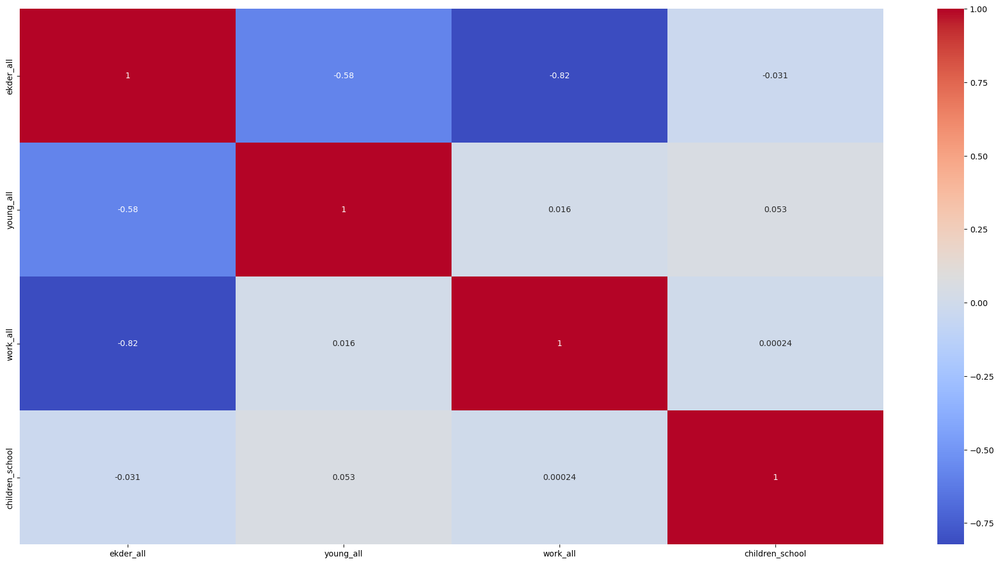

In [929]:
f, ax = plt.subplots(figsize=(24, 12))

sns.heatmap(ages.corr(), annot=True, cmap='coolwarm')

inverse correlation between pensioners and working people. But we have best result

Use it for all our dataset

In [930]:
df.drop(columns=age_columns, axis=1, inplace=True)

In [931]:
df.drop(columns=df.columns[df.columns.str.contains('pre')], axis=1, inplace=True)

In [932]:
df = pd.concat([df, ages], axis=1)
df = df.loc[:, ~df.columns.duplicated()]
df

,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,...,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc,ekder_all,young_all,work_all,children_school
0,43.00,27.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,22,1,0,52,4,5850000.00,0.232760,0.135976,0.631264,10309
1,34.00,19.0,3.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,29,1,10,66,14,6000000.00,0.255141,0.136339,0.608520,7759
2,43.00,29.0,2.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,27,0,4,67,10,5700000.00,0.248673,0.128092,0.623235,6207
3,89.00,50.0,9.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,4,0,0,26,3,13100000.00,0.165454,0.160041,0.674505,13670
4,77.00,77.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,236,2,91,195,14,16331452.00,0.247386,0.123582,0.629032,6748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,52.20,31.8,10.0,12.0,5.0,1973.0,2.0,9.1,2.0,Investment,...,39,2,3,75,12,7118500.41,0.239599,0.107460,0.652942,7960
38129,54.09,30.0,14.0,0.0,1.0,1980.0,2.0,0.0,2.0,OwnerOccupier,...,10,0,0,0,0,7118500.41,0.215191,0.143341,0.641469,915
38130,41.08,1.0,12.0,1.0,1.0,1.0,1.0,1.0,1.0,OwnerOccupier,...,249,2,105,203,13,7118500.41,0.267774,0.149542,0.582684,6398
38131,34.80,19.8,8.0,9.0,5.0,1977.0,1.0,6.4,2.0,Investment,...,11,0,2,43,10,7118500.41,0.187847,0.093388,0.718765,7227


## Explore new correlation

In [478]:
corr_matrix = df.corr()

In [479]:
choose_columns_with_high_corr(corr_matrix, 0.99)

{('raion_build_count_with_builddate_info',
  'raion_build_count_with_material_info'): 0.9999895774989693,
 ('metro_km_walk', 'metro_min_walk'): 0.9999999999999921,
 ('railroad_station_walk_min', 'railroad_station_walk_km'): 0.9999999999999942,
 ('public_transport_station_min_walk',
  'public_transport_station_km'): 0.9999999999999919,
 ('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('cafe_avg_price_1000', 'cafe_sum_1000_min_price_avg'): 0.99398983150998,
 ('cafe_avg_price_1000', 'cafe_sum_1000_max_price_avg'): 0.9974330205243671,
 ('cafe_count_1000_price_500', 'cafe_count_1000'): 0.9925082019399911,
 ('cafe_count_1000_price_1500', 'cafe_count_1000'): 0.991864949907537,
 ('cafe_count_1500', 'cafe_count_1000'): 0.9947443742228644,
 ('cafe_avg_price_1500', 'cafe_sum_1500_min_price_avg'): 0.9933052787040031,
 ('cafe_avg_price_1500'

## Explore cafe values group

In [481]:
cafe_columns = df.columns[df.columns.str.contains('cafe')] 
cafe_columns

Index(['cafe_count_500', 'cafe_count_500_na_price', 'cafe_count_500_price_500',
       'cafe_count_500_price_1000', 'cafe_count_500_price_1500',
       'cafe_count_500_price_2500', 'cafe_count_500_price_4000',
       'cafe_count_500_price_high', 'cafe_count_1000',
       'cafe_sum_1000_min_price_avg', 'cafe_sum_1000_max_price_avg',
       'cafe_avg_price_1000', 'cafe_count_1000_na_price',
       'cafe_count_1000_price_500', 'cafe_count_1000_price_1000',
       'cafe_count_1000_price_1500', 'cafe_count_1000_price_2500',
       'cafe_count_1000_price_4000', 'cafe_count_1000_price_high',
       'cafe_count_1500', 'cafe_sum_1500_min_price_avg',
       'cafe_sum_1500_max_price_avg', 'cafe_avg_price_1500',
       'cafe_count_1500_na_price', 'cafe_count_1500_price_500',
       'cafe_count_1500_price_1000', 'cafe_count_1500_price_1500',
       'cafe_count_1500_price_2500', 'cafe_count_1500_price_4000',
       'cafe_count_1500_price_high', 'cafe_count_2000',
       'cafe_sum_2000_min_price_avg'

In [533]:
cafe = df[cafe_columns].copy()
cafe

,cafe_count_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,cafe_count_1000,cafe_sum_1000_min_price_avg,...,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high
0,0,0,0,0,0,0,0,0,19,527.78,...,708.57,1185.71,947.14,12,39,48,40,9,4,0
1,5,0,1,3,0,0,1,0,13,615.38,...,673.81,1148.81,911.31,9,49,65,36,15,3,0
2,3,0,0,2,1,0,0,0,9,642.86,...,702.68,1196.43,949.55,10,29,45,25,10,3,0
3,2,0,0,0,2,0,0,0,12,658.33,...,931.58,1552.63,1242.11,4,7,21,15,11,2,1
4,48,3,17,10,11,7,0,0,153,763.45,...,853.88,1411.45,1132.66,143,566,578,552,319,108,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,2,0,2,0,0,0,0,0,14,700.00,...,696.58,1167.81,932.19,15,83,98,81,28,1,1
38129,1,0,0,0,1,0,0,0,1,1000.00,...,1114.29,1857.14,1485.71,0,1,2,1,2,1,0
38130,71,9,19,11,13,14,4,1,316,914.53,...,880.53,1451.32,1165.93,170,639,642,636,371,141,26
38131,3,0,1,2,0,0,0,0,20,542.11,...,689.87,1183.54,936.71,10,20,34,16,7,2,0


<AxesSubplot:>

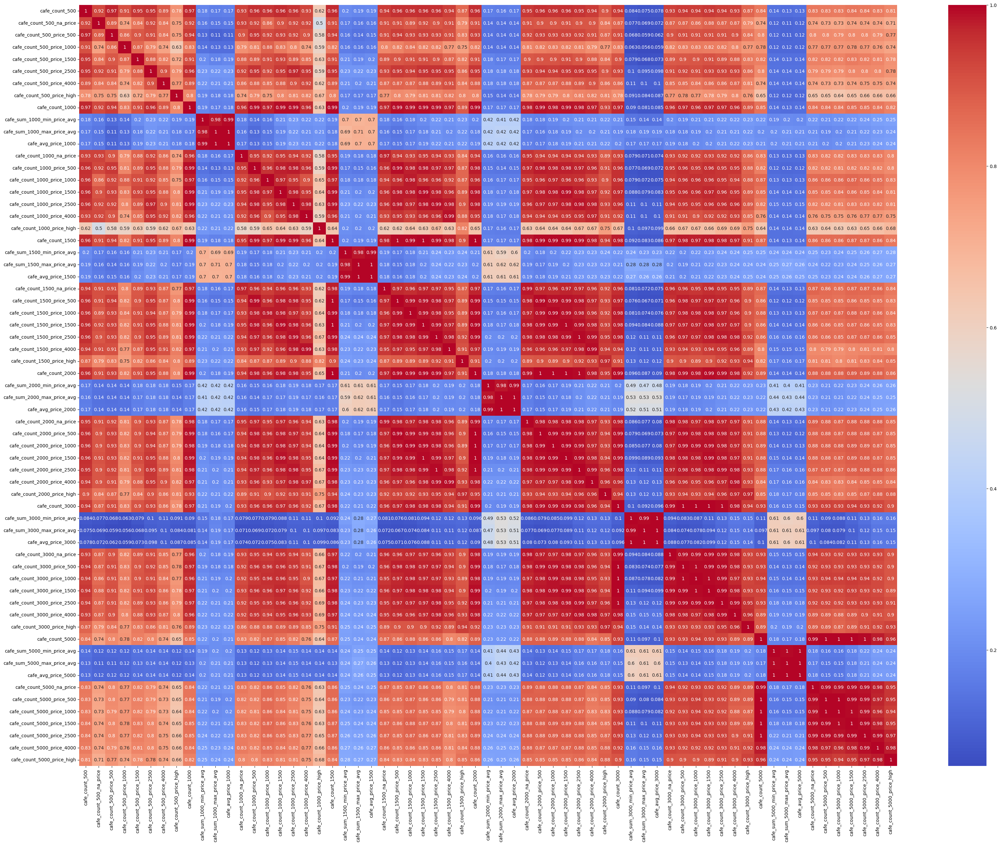

In [534]:
f, ax = plt.subplots(figsize=(40,30))

sns.heatmap(cafe.corr(), annot=True, cmap='coolwarm')

In [535]:
corr_matrix['price_doc'][cafe_columns].sort_values(ascending=False)

cafe_count_5000_price_1000     0.213113
cafe_count_5000_price_1500     0.206036
cafe_count_5000                0.205194
cafe_count_5000_na_price       0.203981
cafe_count_5000_price_500      0.201157
                                 ...   
cafe_avg_price_5000            0.031424
cafe_sum_5000_min_price_avg    0.030880
cafe_sum_3000_min_price_avg    0.009762
cafe_avg_price_3000            0.007381
cafe_sum_3000_max_price_avg    0.006327
Name: price_doc, Length: 63, dtype: float64

In [536]:
r = abs(corr_matrix['price_doc'].sort_values(ascending=False))

In [537]:
r.mean()

0.11860757450224116

In [538]:
cafe_influence = corr_matrix['price_doc'][cafe_columns].sort_values(ascending=False)

In [539]:
avg_columns = cafe_influence.index[cafe_influence.index.str.contains('avg')]

In [540]:
cafe_influence[avg_columns]

cafe_avg_price_1500            0.098127
cafe_sum_1500_max_price_avg    0.098037
cafe_sum_1500_min_price_avg    0.096022
cafe_sum_2000_max_price_avg    0.094726
cafe_avg_price_2000            0.094120
cafe_sum_2000_min_price_avg    0.091952
cafe_sum_1000_min_price_avg    0.086922
cafe_avg_price_1000            0.082708
cafe_sum_1000_max_price_avg    0.081003
cafe_sum_5000_max_price_avg    0.031759
cafe_avg_price_5000            0.031424
cafe_sum_5000_min_price_avg    0.030880
cafe_sum_3000_min_price_avg    0.009762
cafe_avg_price_3000            0.007381
cafe_sum_3000_max_price_avg    0.006327
Name: price_doc, dtype: float64

#### Hypothesis: leaving columns with the average price value will reduce the correlation

In [544]:
cafe['cafe_avg_price_1000'] = cafe['cafe_avg_price_1000'] / cafe['cafe_count_1000'] 

In [541]:
drop_cols = cafe.columns[cafe.columns.str.contains('.*_.*_1000_.*')]

In [542]:
cafe.drop(columns=drop_cols, axis=1,inplace=True)

In [545]:
cafe.drop(columns='cafe_count_1000', axis=1,inplace=True)

<AxesSubplot:>

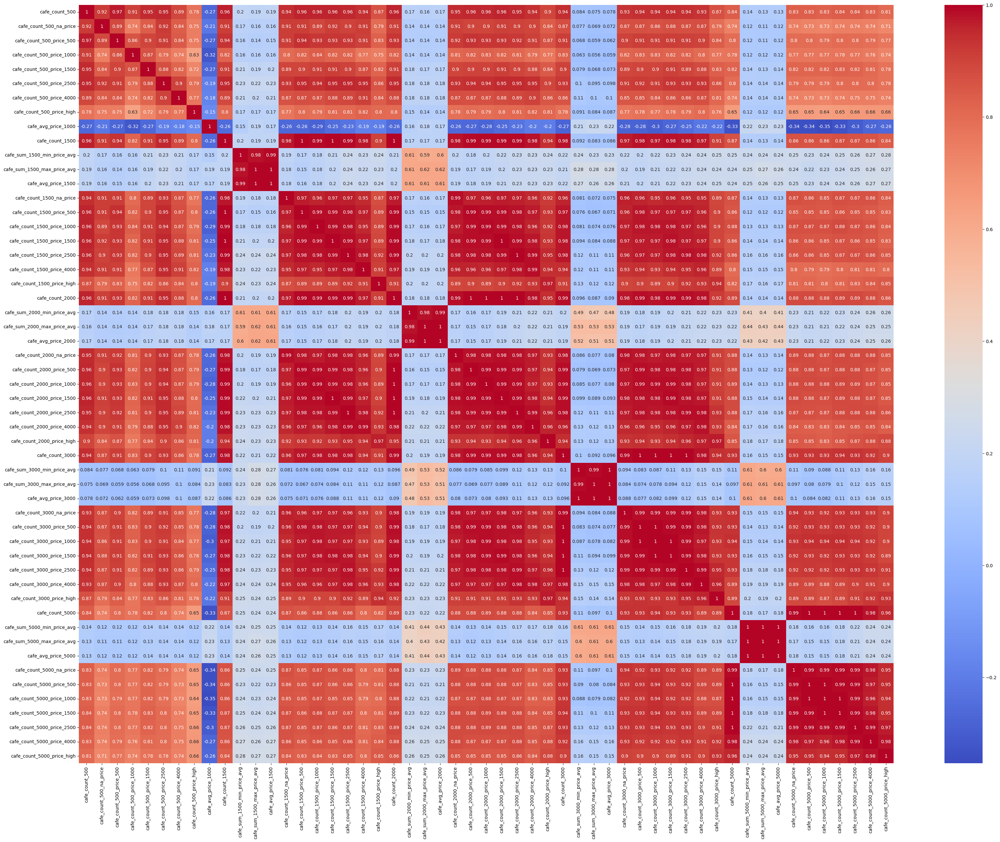

In [546]:
f, ax = plt.subplots(figsize=(40,30))

sns.heatmap(cafe.corr(), annot=True, cmap='coolwarm')

#### Create common method

In [933]:
cafe = df[cafe_columns]
cafe.head()

,cafe_count_500,cafe_count_500_na_price,cafe_count_500_price_500,cafe_count_500_price_1000,cafe_count_500_price_1500,cafe_count_500_price_2500,cafe_count_500_price_4000,cafe_count_500_price_high,cafe_count_1000,cafe_sum_1000_min_price_avg,...,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,cafe_count_5000_na_price,cafe_count_5000_price_500,cafe_count_5000_price_1000,cafe_count_5000_price_1500,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high
0,0,0,0,0,0,0,0,0,19,527.78,...,708.57,1185.71,947.14,12,39,48,40,9,4,0
1,5,0,1,3,0,0,1,0,13,615.38,...,673.81,1148.81,911.31,9,49,65,36,15,3,0
2,3,0,0,2,1,0,0,0,9,642.86,...,702.68,1196.43,949.55,10,29,45,25,10,3,0
3,2,0,0,0,2,0,0,0,12,658.33,...,931.58,1552.63,1242.11,4,7,21,15,11,2,1
4,48,3,17,10,11,7,0,0,153,763.45,...,853.88,1411.45,1132.66,143,566,578,552,319,108,17


In [934]:
def manipulate_data(cafe):
    avg_columns = cafe.columns[cafe.columns.str.contains('cafe_avg')]
    count_columns = cafe.columns[cafe.columns.str.contains('cafe_count_(10|15|20|30|50)00$')]
        
    cafe.drop(columns=count_columns, axis=1,inplace=True)
    
    drop_cols = cafe.columns[cafe.columns.str.contains('.*_.*_(10|15|20|30|50)00_.*')]
    cafe.drop(columns=drop_cols, axis=1,inplace=True)

In [935]:
manipulate_data(cafe)

C:\Users\User\AppData\Local\Temp\ipykernel_13260\1138191374.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  count_columns = cafe.columns[cafe.columns.str.contains('cafe_count_(10|15|20|30|50)00$')]
C:\Users\User\AppData\Local\Temp\ipykernel_13260\1138191374.py:7: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_cols = cafe.columns[cafe.columns.str.contains('.*_.*_(10|15|20|30|50)00_.*')]


<AxesSubplot:>

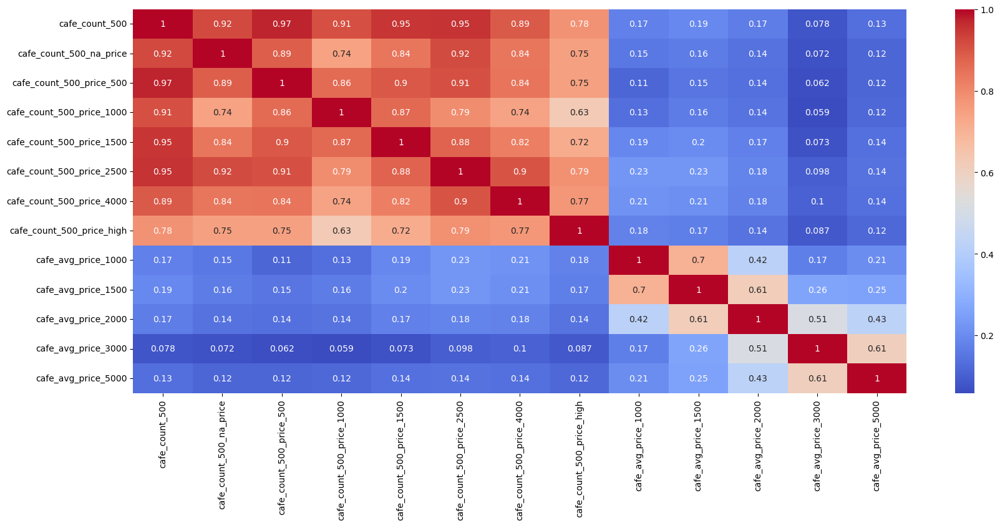

In [936]:
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(cafe.corr(), annot=True, cmap='coolwarm')

In [618]:
columns = cafe.columns[cafe.columns.str.contains('cafe_count_500_')]

In [619]:
cafe['cafe_count_500_na_price'].describe()

count    38133.000000
mean         0.347599
std          1.366758
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         13.000000
Name: cafe_count_500_na_price, dtype: float64

In [620]:
cafe['cafe_count_500_na_price'] = 0 

In [621]:
cafe['cafe_count_500_price_high'].describe()

count    38133.000000
mean         0.029423
std          0.180691
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.000000
Name: cafe_count_500_price_high, dtype: float64

In [622]:
cafe['cafe_count_500_price_high'] = 0

In [638]:
a = [500, 1000, 1500, 2500, 4000]
sum = 0 

for i in a:
    sum += i * cafe[f"cafe_count_500_price_{i}"].sum()

print(sum / cafe["cafe_count_500"].sum())    

1202.1897224210716


In [937]:
drop_cols = cafe.columns[cafe.columns.str.contains('^cafe_count_.*(500|1500|1500|2500|4000|high|na_price)$')]
drop_cols

C:\Users\User\AppData\Local\Temp\ipykernel_13260\2083392387.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_cols = cafe.columns[cafe.columns.str.contains('^cafe_count_.*(500|1500|1500|2500|4000|high|na_price)$')]


Index(['cafe_count_500', 'cafe_count_500_na_price', 'cafe_count_500_price_500',
       'cafe_count_500_price_1500', 'cafe_count_500_price_2500',
       'cafe_count_500_price_4000', 'cafe_count_500_price_high'],
      dtype='object')

In [938]:
cafe.drop(columns=drop_cols, axis=1,inplace=True)

<AxesSubplot:>

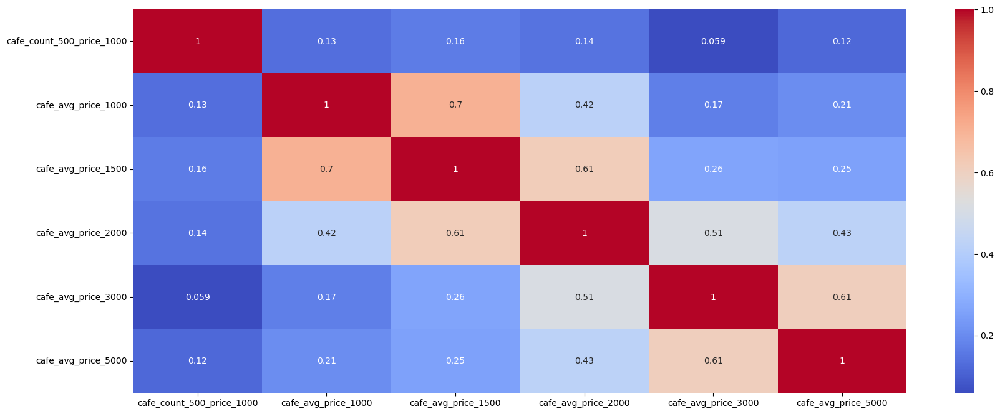

In [650]:
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(cafe.corr(), annot=True, cmap='coolwarm')

In [939]:
df.drop(columns=cafe_columns,axis=1,inplace=True)

In [940]:
df = pd.concat([df, cafe], axis=1)
df = df.loc[:, ~df.columns.duplicated()]
df

,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,...,ekder_all,young_all,work_all,children_school,cafe_count_500_price_1000,cafe_avg_price_1000,cafe_avg_price_1500,cafe_avg_price_2000,cafe_avg_price_3000,cafe_avg_price_5000
0,43.00,27.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,0.232760,0.135976,0.631264,10309,0,708.33,768.18,828.57,859.52,947.14
1,34.00,19.0,3.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,0.255141,0.136339,0.608520,7759,3,846.15,950.00,942.86,858.62,911.31
2,43.00,29.0,2.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,0.248673,0.128092,0.623235,6207,2,892.86,716.67,770.45,944.87,949.55
3,89.00,50.0,9.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,0.165454,0.160041,0.674505,13670,0,870.83,902.17,890.00,968.75,1242.11
4,77.00,77.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,0.247386,0.123582,0.629032,6748,10,1017.93,1019.76,1017.58,1131.74,1132.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,52.20,31.8,10.0,12.0,5.0,1973.0,2.0,9.1,2.0,Investment,...,0.239599,0.107460,0.652942,7960,0,926.92,886.36,843.59,940.34,932.19
38129,54.09,30.0,14.0,0.0,1.0,1980.0,2.0,0.0,2.0,OwnerOccupier,...,0.215191,0.143341,0.641469,915,0,1250.00,1250.00,1250.00,1000.00,1485.71
38130,41.08,1.0,12.0,1.0,1.0,1.0,1.0,1.0,1.0,OwnerOccupier,...,0.267774,0.149542,0.582684,6398,11,1207.26,1187.60,1180.19,1167.66,1165.93
38131,34.80,19.8,8.0,9.0,5.0,1977.0,1.0,6.4,2.0,Investment,...,0.187847,0.093388,0.718765,7227,2,744.74,844.23,926.47,969.15,936.71


## Explore new correlation

In [655]:
corr_matrix = df.corr()

In [717]:
choose_columns_with_high_corr(corr_matrix, 0.95)

{('raion_build_count_with_builddate_info',
  'raion_build_count_with_material_info'): 0.9999895774989693,
 ('metro_min_walk', 'metro_km_avto'): 0.9863975738885596,
 ('metro_km_walk', 'metro_km_avto'): 0.9863975738879126,
 ('metro_km_walk', 'metro_min_walk'): 0.9999999999999921,
 ('railroad_station_walk_min', 'railroad_station_walk_km'): 0.9999999999999942,
 ('railroad_station_avto_km', 'railroad_station_walk_km'): 0.9657162572973642,
 ('railroad_station_avto_km', 'railroad_station_walk_min'): 0.9657162572993321,
 ('public_transport_station_min_walk',
  'public_transport_station_km'): 0.9999999999999919,
 ('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'ttk_km'): 0.9870451096538012,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'ttk_km'): 0.9846650652585549,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('zd_vokzaly_avto_km', 'ttk_km'): 0.9598965923981362,
 ('zd_vokzaly_avto_km', 'sad

In [673]:
raion_cols = df.columns[df.columns.str.contains('raion_build')]

raion_build_count_with_material_info	Number of building with material info in district

raion_build_count_with_builddate_info	Number of building with build year info in district

In [677]:
corr_matrix['price_doc'][raion_cols]

raion_build_count_with_material_info     0.065559
raion_build_count_with_builddate_info    0.065449
Name: price_doc, dtype: float64

In [941]:
df.drop('raion_build_count_with_builddate_info', axis=1,inplace=True)

In [942]:
df.drop(columns=df.columns[df.columns.str.contains('ID')], axis=1,inplace=True)

## Trasport parameters

In [703]:
matrix = df.corr()

In [709]:
price = matrix['price_doc']

metro, railroad_station

In [943]:
transport_columns = df.columns[df.columns.str.contains('(metro_(min|km)|public_transport|rail.*_(walk|avto))')]
transport_columns

C:\Users\User\AppData\Local\Temp\ipykernel_13260\138189903.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  transport_columns = df.columns[df.columns.str.contains('(metro_(min|km)|public_transport|rail.*_(walk|avto))')]


Index(['metro_min_avto', 'metro_km_avto', 'metro_min_walk', 'metro_km_walk',
       'railroad_station_walk_km', 'railroad_station_walk_min',
       'railroad_station_avto_km', 'railroad_station_avto_min',
       'public_transport_station_km', 'public_transport_station_min_walk'],
      dtype='object')

In [944]:
transport = df[transport_columns]
transport

,metro_min_avto,metro_km_avto,metro_min_walk,metro_km_walk,railroad_station_walk_km,railroad_station_walk_min,railroad_station_avto_km,railroad_station_avto_min,public_transport_station_km,public_transport_station_min_walk
0,2.590241,1.131260,13.575119,1.131260,5.419893,65.038716,5.419893,6.905893,0.274985,3.299822
1,0.936700,0.647337,7.620630,0.635053,3.411993,40.943917,3.641773,4.679745,0.065263,0.783160
2,2.120999,1.637996,17.351515,1.445960,1.277658,15.331896,1.277658,1.701420,0.328756,3.945073
3,1.489049,0.984537,11.565624,0.963802,4.291432,51.497190,3.816045,5.271136,0.131597,1.579164
4,1.257186,0.876620,8.266305,0.688859,0.853960,10.247521,1.595898,2.156284,0.071480,0.857764
...,...,...,...,...,...,...,...,...,...,...
38128,1.789207,1.179312,13.968183,1.164015,8.989496,107.873950,9.046194,11.649396,0.069066,0.828790
38129,15.839451,12.718568,144.236338,12.019695,18.449574,221.394885,21.279217,21.765343,1.791212,21.494546
38130,1.482746,1.036568,13.459068,1.121589,3.378717,40.544603,4.060430,5.143798,0.326035,3.912418
38131,1.469263,0.930198,11.162378,0.930198,5.018911,60.226932,4.766769,6.164570,0.116044,1.392524


<AxesSubplot:>

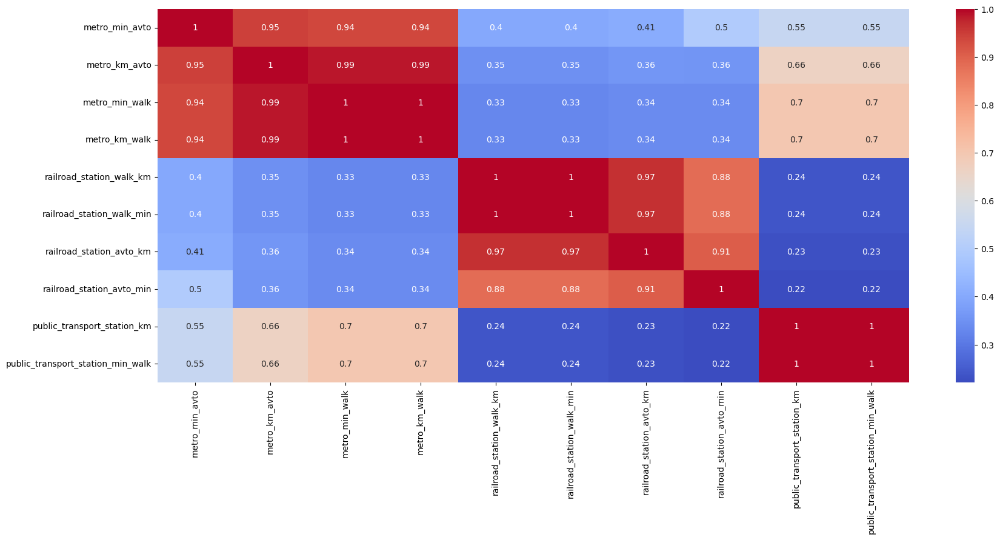

In [726]:
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(transport.corr(), annot=True, cmap='coolwarm')

In [728]:
price[transport_columns]

metro_min_avto                      -0.173893
metro_km_avto                       -0.159564
metro_min_walk                      -0.159936
metro_km_walk                       -0.159936
railroad_station_walk_km            -0.117913
railroad_station_walk_min           -0.117913
railroad_station_avto_km            -0.116840
railroad_station_avto_min           -0.125640
public_transport_station_km         -0.100883
public_transport_station_min_walk   -0.100883
Name: price_doc, dtype: float64

In [945]:
drop_cols = transport.columns[transport.columns.str.contains('(km|metro_min_walk|walk_min)')]

C:\Users\User\AppData\Local\Temp\ipykernel_13260\1398748157.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_cols = transport.columns[transport.columns.str.contains('(km|metro_min_walk|walk_min)')]


In [946]:
transport.drop(columns=drop_cols,axis=1,inplace=True)

<AxesSubplot:>

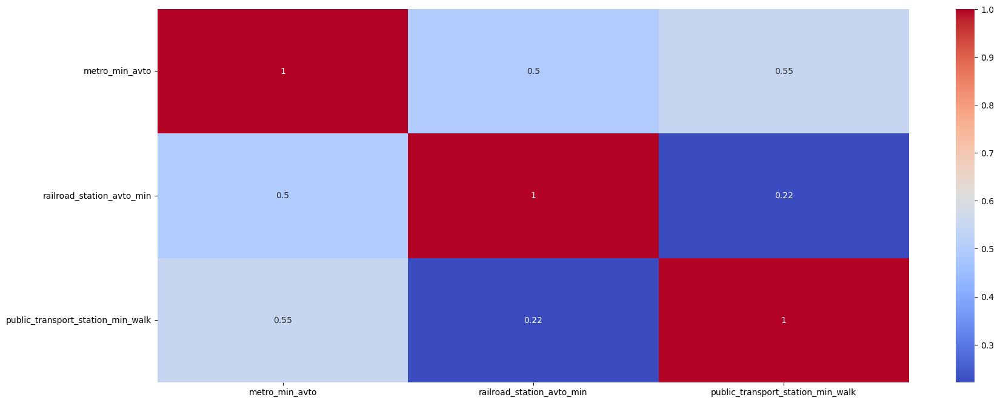

In [734]:
f, ax = plt.subplots(figsize=(20,8))

sns.heatmap(transport.corr(), annot=True, cmap='coolwarm')

In [947]:
df.drop(columns=transport_columns,axis=1,inplace=True)

In [948]:
df = pd.concat([df, transport], axis=1)
df = df.loc[:, ~df.columns.duplicated()]
df

,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,...,children_school,cafe_count_500_price_1000,cafe_avg_price_1000,cafe_avg_price_1500,cafe_avg_price_2000,cafe_avg_price_3000,cafe_avg_price_5000,metro_min_avto,railroad_station_avto_min,public_transport_station_min_walk
0,43.00,27.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,10309,0,708.33,768.18,828.57,859.52,947.14,2.590241,6.905893,3.299822
1,34.00,19.0,3.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,7759,3,846.15,950.00,942.86,858.62,911.31,0.936700,4.679745,0.783160
2,43.00,29.0,2.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,6207,2,892.86,716.67,770.45,944.87,949.55,2.120999,1.701420,3.945073
3,89.00,50.0,9.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,13670,0,870.83,902.17,890.00,968.75,1242.11,1.489049,5.271136,1.579164
4,77.00,77.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,6748,10,1017.93,1019.76,1017.58,1131.74,1132.66,1.257186,2.156284,0.857764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,52.20,31.8,10.0,12.0,5.0,1973.0,2.0,9.1,2.0,Investment,...,7960,0,926.92,886.36,843.59,940.34,932.19,1.789207,11.649396,0.828790
38129,54.09,30.0,14.0,0.0,1.0,1980.0,2.0,0.0,2.0,OwnerOccupier,...,915,0,1250.00,1250.00,1250.00,1000.00,1485.71,15.839451,21.765343,21.494546
38130,41.08,1.0,12.0,1.0,1.0,1.0,1.0,1.0,1.0,OwnerOccupier,...,6398,11,1207.26,1187.60,1180.19,1167.66,1165.93,1.482746,5.143798,3.912418
38131,34.80,19.8,8.0,9.0,5.0,1977.0,1.0,6.4,2.0,Investment,...,7227,2,744.74,844.23,926.47,969.15,936.71,1.469263,6.164570,1.392524


## Exploration new correlation

In [737]:
corr_matrix = df.corr()

In [738]:
choose_columns_with_high_corr(corr_matrix, 0.95)

{('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'ttk_km'): 0.9870451096538012,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'ttk_km'): 0.9846650652585549,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('zd_vokzaly_avto_km', 'ttk_km'): 0.9598965923981362,
 ('zd_vokzaly_avto_km', 'sadovoe_km'): 0.9697784821879178,
 ('zd_vokzaly_avto_km', 'bulvar_ring_km'): 0.9708382251200821,
 ('zd_vokzaly_avto_km', 'kremlin_km'): 0.9657739323384571,
 ('church_count_1000', 'church_count_500'): 0.9624277326504928,
 ('church_count_1000', 'big_church_count_1000'): 0.954402778054916,
 ('office_count_1500', 'office_count_1000'): 0.9785059205469262,
 ('big_church_count_1500', 'big_church_count_1000'): 0.9695836795878552,
 ('big_church_count_1500', 'church_count_1000'): 0.9703879255954372,
 ('church_count_1500', 'big_church_count_1000'): 0.9524670663704079,
 ('church_count_1500', 'church_count_1000'): 0.984

## Church analyze

In [949]:
church_cols =  df.columns[df.columns.str.contains('church')]

In [950]:
church = df[church_cols]
church

,big_church_km,church_synagogue_km,big_church_count_500,church_count_500,big_church_count_1000,church_count_1000,big_church_count_1500,church_count_1500,big_church_count_2000,church_count_2000,big_church_count_3000,church_count_3000,big_church_count_5000,church_count_5000
0,0.625783,0.628187,0,0,1,2,1,2,1,2,2,4,13,22
1,0.967821,0.471447,0,1,1,2,1,5,1,5,1,7,15,29
2,3.178751,0.755946,0,0,0,1,0,4,0,4,0,11,11,27
3,1.031777,1.561505,0,0,0,0,1,0,1,1,1,2,4,4
4,0.378756,0.121681,1,4,7,12,18,30,35,61,70,121,135,236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,2.168285,0.880415,0,0,0,1,0,5,0,6,2,15,8,39
38129,9.559846,0.781791,0,0,0,1,0,1,0,2,0,3,0,10
38130,0.181897,0.184681,8,15,16,35,44,66,67,104,94,162,150,249
38131,2.411682,0.331122,0,1,0,1,0,2,0,2,2,5,5,11


<AxesSubplot:>

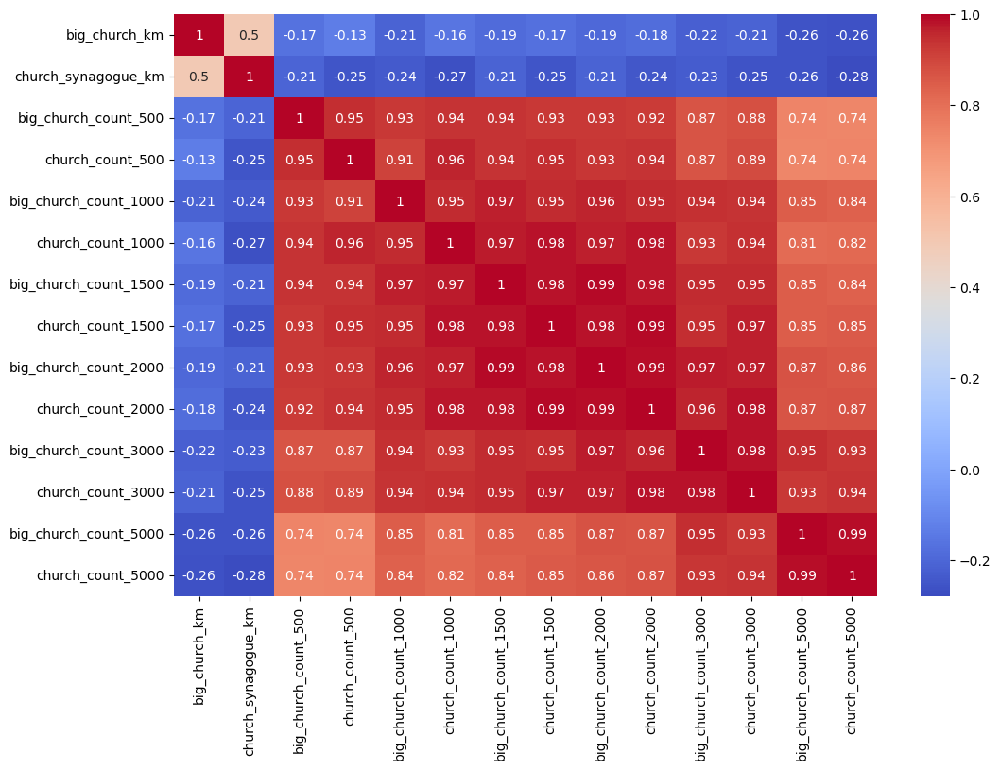

In [745]:
f, ax = plt.subplots(figsize=(12,8))

sns.heatmap(church.corr(), annot=True, cmap='coolwarm')

In [951]:
church_count_cols = church.columns[church.columns.str.contains('church_count')]
church_count_cols

Index(['big_church_count_500', 'church_count_500', 'big_church_count_1000',
       'church_count_1000', 'big_church_count_1500', 'church_count_1500',
       'big_church_count_2000', 'church_count_2000', 'big_church_count_3000',
       'church_count_3000', 'big_church_count_5000', 'church_count_5000'],
      dtype='object')

In [952]:
df.drop(columns=church_count_cols,axis=1,inplace=True)

## Exploration new correlation

In [751]:
corr_matrix = df.corr()

In [755]:
choose_columns_with_high_corr(corr_matrix, 0.95)

{('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'ttk_km'): 0.9870451096538012,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'ttk_km'): 0.9846650652585549,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('zd_vokzaly_avto_km', 'ttk_km'): 0.9598965923981362,
 ('zd_vokzaly_avto_km', 'sadovoe_km'): 0.9697784821879178,
 ('zd_vokzaly_avto_km', 'bulvar_ring_km'): 0.9708382251200821,
 ('zd_vokzaly_avto_km', 'kremlin_km'): 0.9657739323384571,
 ('office_count_1500', 'office_count_1000'): 0.9785059205469262,
 ('leisure_count_1500', 'leisure_count_1000'): 0.958803054459775,
 ('office_count_2000', 'office_count_1000'): 0.9608574685331821,
 ('office_count_2000', 'office_count_1500'): 0.9919486660519894,
 ('leisure_count_2000', 'leisure_count_1500'): 0.9704586014941645,
 ('office_count_3000', 'office_count_1500'): 0.9800707180107162,
 ('office_count_3000', 'office_count_2000'): 0.9926595071274196,


#### Drop columns with low information

In [953]:
drop_cols = []

for column in df.columns:
    if column != 'price_doc':
        cnt = df[column].value_counts(dropna=False)
        cnt_pct = (cnt / df.shape[0]).iloc[0]
        
        if cnt_pct > 0.9:
            drop_cols.append(column)
            print('{0}: {1:.5f}%'.format(column, cnt_pct*100))
            print(cnt)
            print()

culture_objects_top_25: 93.13193%
no     35514
yes     2619
Name: culture_objects_top_25, dtype: int64

culture_objects_top_25_raion: 93.13193%
0     35514
1      1304
10      859
3       243
2       114
4        99
Name: culture_objects_top_25_raion, dtype: int64

thermal_power_plant_raion: 94.57688%
no     36065
yes     2068
Name: thermal_power_plant_raion, dtype: int64

incineration_raion: 93.22896%
no     35551
yes     2582
Name: incineration_raion, dtype: int64

oil_chemistry_raion: 99.05331%
no     37772
yes      361
Name: oil_chemistry_raion, dtype: int64

railroad_terminal_raion: 96.18703%
no     36679
yes     1454
Name: railroad_terminal_raion, dtype: int64

big_market_raion: 91.20447%
no     34779
yes     3354
Name: big_market_raion, dtype: int64

nuclear_reactor_raion: 97.08389%
no     37021
yes     1112
Name: nuclear_reactor_raion, dtype: int64

build_count_foam: 95.40818%
0.0     36382
1.0      1169
11.0      333
2.0       249
Name: build_count_foam, dtype: int64

water_1l

In [954]:
df.drop(columns=drop_cols, axis=1, inplace=True)
df

,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,product_type,...,children_school,cafe_count_500_price_1000,cafe_avg_price_1000,cafe_avg_price_1500,cafe_avg_price_2000,cafe_avg_price_3000,cafe_avg_price_5000,metro_min_avto,railroad_station_avto_min,public_transport_station_min_walk
0,43.00,27.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,10309,0,708.33,768.18,828.57,859.52,947.14,2.590241,6.905893,3.299822
1,34.00,19.0,3.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,7759,3,846.15,950.00,942.86,858.62,911.31,0.936700,4.679745,0.783160
2,43.00,29.0,2.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,6207,2,892.86,716.67,770.45,944.87,949.55,2.120999,1.701420,3.945073
3,89.00,50.0,9.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,13670,0,870.83,902.17,890.00,968.75,1242.11,1.489049,5.271136,1.579164
4,77.00,77.0,4.0,12.0,1.0,1980.0,2.0,6.0,2.0,Investment,...,6748,10,1017.93,1019.76,1017.58,1131.74,1132.66,1.257186,2.156284,0.857764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,52.20,31.8,10.0,12.0,5.0,1973.0,2.0,9.1,2.0,Investment,...,7960,0,926.92,886.36,843.59,940.34,932.19,1.789207,11.649396,0.828790
38129,54.09,30.0,14.0,0.0,1.0,1980.0,2.0,0.0,2.0,OwnerOccupier,...,915,0,1250.00,1250.00,1250.00,1000.00,1485.71,15.839451,21.765343,21.494546
38130,41.08,1.0,12.0,1.0,1.0,1.0,1.0,1.0,1.0,OwnerOccupier,...,6398,11,1207.26,1187.60,1180.19,1167.66,1165.93,1.482746,5.143798,3.912418
38131,34.80,19.8,8.0,9.0,5.0,1977.0,1.0,6.4,2.0,Investment,...,7227,2,744.74,844.23,926.47,969.15,936.71,1.469263,6.164570,1.392524


In [807]:
corr_matrix = df.corr()

In [810]:
choose_columns_with_high_corr(corr_matrix, 0.95)

{('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'ttk_km'): 0.9870451096538012,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'ttk_km'): 0.9846650652585549,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('zd_vokzaly_avto_km', 'ttk_km'): 0.9598965923981362,
 ('zd_vokzaly_avto_km', 'sadovoe_km'): 0.9697784821879178,
 ('zd_vokzaly_avto_km', 'bulvar_ring_km'): 0.9708382251200821,
 ('zd_vokzaly_avto_km', 'kremlin_km'): 0.9657739323384571,
 ('office_count_1500', 'office_count_1000'): 0.9785059205469262,
 ('leisure_count_1500', 'leisure_count_1000'): 0.958803054459775,
 ('office_count_2000', 'office_count_1000'): 0.9608574685331821,
 ('office_count_2000', 'office_count_1500'): 0.9919486660519894,
 ('leisure_count_2000', 'leisure_count_1500'): 0.9704586014941645,
 ('office_count_3000', 'office_count_1500'): 0.9800707180107162,
 ('office_count_3000', 'office_count_2000'): 0.9926595071274196,


## Objects of city

In [955]:
obj_cols = df.columns[df.columns.str.contains('(office|leisure|sport|trc|mosque|market)')]
obj_cols

C:\Users\User\AppData\Local\Temp\ipykernel_13260\582789801.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  obj_cols = df.columns[df.columns.str.contains('(office|leisure|sport|trc|mosque|market)')]


Index(['sport_objects_raion', 'office_raion', 'big_market_km',
       'market_shop_km', 'office_km', 'mosque_km', 'office_count_500',
       'office_sqm_500', 'trc_count_500', 'trc_sqm_500', 'sport_count_500',
       'market_count_500', 'office_count_1000', 'office_sqm_1000',
       'trc_count_1000', 'trc_sqm_1000', 'leisure_count_1000',
       'sport_count_1000', 'market_count_1000', 'office_count_1500',
       'office_sqm_1500', 'trc_count_1500', 'trc_sqm_1500',
       'leisure_count_1500', 'sport_count_1500', 'market_count_1500',
       'office_count_2000', 'office_sqm_2000', 'trc_count_2000',
       'trc_sqm_2000', 'leisure_count_2000', 'sport_count_2000',
       'market_count_2000', 'office_count_3000', 'office_sqm_3000',
       'trc_count_3000', 'trc_sqm_3000', 'mosque_count_3000',
       'leisure_count_3000', 'sport_count_3000', 'market_count_3000',
       'office_count_5000', 'office_sqm_5000', 'trc_count_5000',
       'trc_sqm_5000', 'mosque_count_5000', 'leisure_count_5000',


In [956]:
objects = df[obj_cols]
objects

,sport_objects_raion,office_raion,big_market_km,market_shop_km,office_km,mosque_km,office_count_500,office_sqm_500,trc_count_500,trc_sqm_500,...,market_count_3000,office_count_5000,office_sqm_5000,trc_count_5000,trc_sqm_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,public_transport_station_min_walk
0,7,1,10.814172,1.676258,0.637189,3.932040,0,0,0,0,...,1,29,807385,52,4036616,1,0,52,4,3.299822
1,6,0,6.910568,3.424716,0.688796,4.841544,0,0,0,0,...,1,66,2690465,40,2034942,1,10,66,14,0.783160
2,5,1,5.752368,1.375443,1.543049,7.922152,0,0,0,0,...,6,43,1478160,35,1572990,0,4,67,10,3.945073
3,17,4,27.892717,0.811275,0.934273,15.300449,0,0,0,0,...,3,8,244166,22,942180,0,0,26,3,1.579164
4,25,93,9.155057,1.969738,0.077901,2.584370,15,293699,1,45000,...,5,689,8404624,114,3503058,2,91,195,14,0.857764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,11,6,2.453438,0.457083,0.395092,2.622857,1,23172,2,18054,...,4,44,1742694,52,1485126,2,3,75,12,0.828790
38129,0,0,11.910442,7.480514,7.937008,10.199456,0,0,0,0,...,0,0,0,0,0,0,0,0,0,21.494546
38130,29,141,7.836658,1.092897,0.182194,1.827838,10,131844,6,467600,...,6,774,9997846,101,3346565,2,105,203,13,3.912418
38131,7,0,0.885412,1.280650,1.467622,8.247379,0,0,1,32000,...,4,2,54500,30,1555688,0,2,43,10,1.392524


In [957]:
objects.drop('public_transport_station_min_walk', axis=1,inplace=True)

<AxesSubplot:>

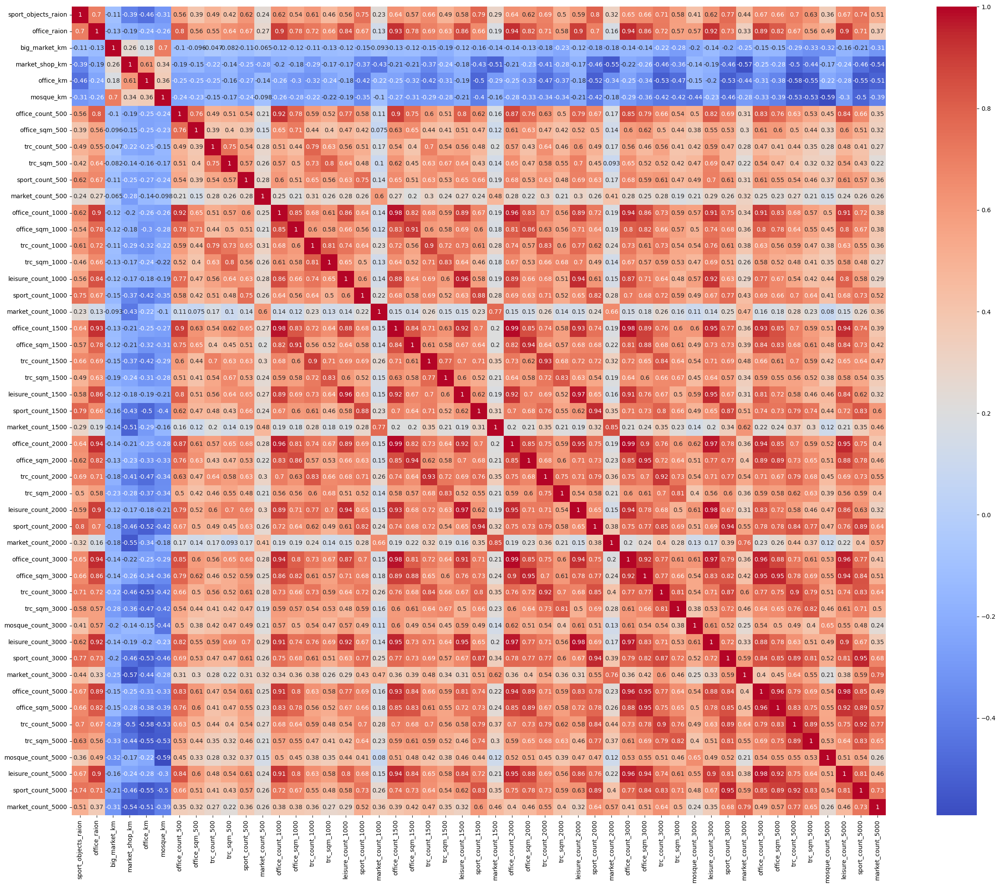

In [842]:
f, ax = plt.subplots(figsize=(30,24))

sns.heatmap(objects.corr(), annot=True, cmap='coolwarm')

office_raion	Number of malls and shopping centres in district


In [958]:
drop_cols = objects.columns[objects.columns.str.contains('(trc|sport|office|leisure|mosque|market)_(count|sqm)')]
drop_cols

C:\Users\User\AppData\Local\Temp\ipykernel_13260\2216779910.py:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  drop_cols = objects.columns[objects.columns.str.contains('(trc|sport|office|leisure|mosque|market)_(count|sqm)')]


Index(['office_count_500', 'office_sqm_500', 'trc_count_500', 'trc_sqm_500',
       'sport_count_500', 'market_count_500', 'office_count_1000',
       'office_sqm_1000', 'trc_count_1000', 'trc_sqm_1000',
       'leisure_count_1000', 'sport_count_1000', 'market_count_1000',
       'office_count_1500', 'office_sqm_1500', 'trc_count_1500',
       'trc_sqm_1500', 'leisure_count_1500', 'sport_count_1500',
       'market_count_1500', 'office_count_2000', 'office_sqm_2000',
       'trc_count_2000', 'trc_sqm_2000', 'leisure_count_2000',
       'sport_count_2000', 'market_count_2000', 'office_count_3000',
       'office_sqm_3000', 'trc_count_3000', 'trc_sqm_3000',
       'mosque_count_3000', 'leisure_count_3000', 'sport_count_3000',
       'market_count_3000', 'office_count_5000', 'office_sqm_5000',
       'trc_count_5000', 'trc_sqm_5000', 'mosque_count_5000',
       'leisure_count_5000', 'sport_count_5000', 'market_count_5000'],
      dtype='object')

In [959]:
objects.drop(columns=drop_cols, axis=1,inplace=True)

<AxesSubplot:>

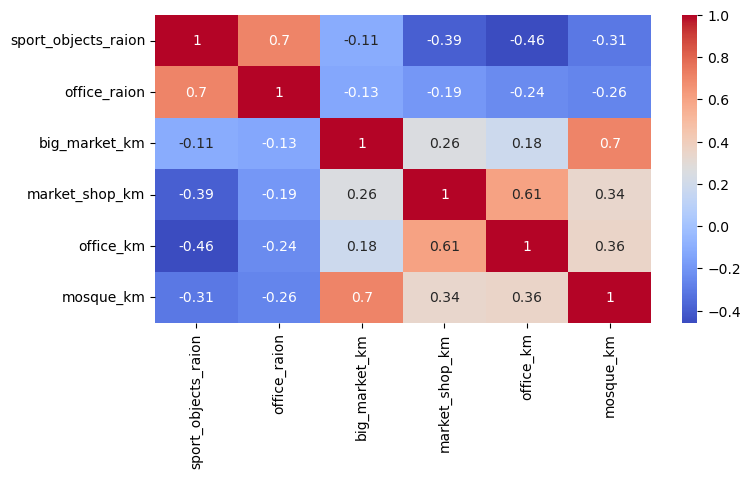

In [874]:
f, ax = plt.subplots(figsize=(8,4))

sns.heatmap(objects.corr(), annot=True, cmap='coolwarm')

In [960]:
df.drop(columns=drop_cols, axis=1,inplace=True)

## Exploration new correlation

In [847]:
corr_matrix = df.corr()

<AxesSubplot:>

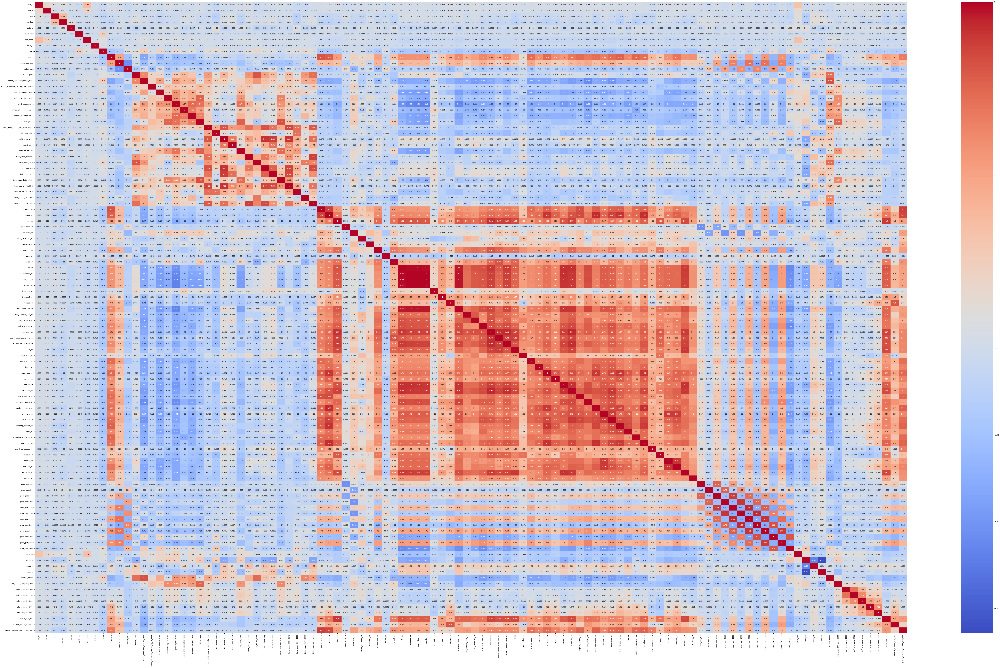

In [853]:
f, ax = plt.subplots(figsize=(120,70))

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

In [859]:
choose_columns_with_high_corr(corr_matrix, 0.92)

{('sadovoe_km', 'ttk_km'): 0.9925509911778705,
 ('bulvar_ring_km', 'ttk_km'): 0.9870451096538012,
 ('bulvar_ring_km', 'sadovoe_km'): 0.9984393572749866,
 ('kremlin_km', 'ttk_km'): 0.9846650652585549,
 ('kremlin_km', 'sadovoe_km'): 0.9974555176266766,
 ('kremlin_km', 'bulvar_ring_km'): 0.9988192066503291,
 ('zd_vokzaly_avto_km', 'ttk_km'): 0.9598965923981362,
 ('zd_vokzaly_avto_km', 'sadovoe_km'): 0.9697784821879178,
 ('zd_vokzaly_avto_km', 'bulvar_ring_km'): 0.9708382251200821,
 ('zd_vokzaly_avto_km', 'kremlin_km'): 0.9657739323384571,
 ('power_transmission_line_km', 'radiation_km'): 0.9251836607660232,
 ('thermal_power_plant_km', 'radiation_km'): 0.9347167048147037,
 ('stadium_km', 'ttk_km'): 0.9202207563163475,
 ('basketball_km', 'radiation_km'): 0.9387123057189608,
 ('basketball_km', 'thermal_power_plant_km'): 0.9260760314467597,
 ('public_healthcare_km', 'school_km'): 0.9300741413415982,
 ('big_church_km', 'school_km'): 0.9242663713839956,
 ('green_part_2000', 'green_part_1500'): 0

## Distance cols

In [857]:
km_cols = df.columns[df.columns.str.contains('km')]
km_cols

Index(['kindergarten_km', 'school_km', 'park_km', 'green_zone_km',
       'industrial_km', 'water_treatment_km', 'cemetery_km', 'incineration_km',
       'water_km', 'mkad_km', 'ttk_km', 'sadovoe_km', 'bulvar_ring_km',
       'kremlin_km', 'big_road1_km', 'big_road2_km', 'railroad_km',
       'zd_vokzaly_avto_km', 'bus_terminal_avto_km', 'oil_chemistry_km',
       'nuclear_reactor_km', 'radiation_km', 'power_transmission_line_km',
       'thermal_power_plant_km', 'ts_km', 'big_market_km', 'market_shop_km',
       'fitness_km', 'swim_pool_km', 'ice_rink_km', 'stadium_km',
       'basketball_km', 'hospice_morgue_km', 'detention_facility_km',
       'public_healthcare_km', 'university_km', 'workplaces_km',
       'shopping_centers_km', 'office_km', 'additional_education_km',
       'big_church_km', 'church_synagogue_km', 'mosque_km', 'theater_km',
       'museum_km', 'exhibition_km', 'catering_km'],
      dtype='object')

In [860]:
km = df[km_cols]
km

,kindergarten_km,school_km,park_km,green_zone_km,industrial_km,water_treatment_km,cemetery_km,incineration_km,water_km,mkad_km,...,shopping_centers_km,office_km,additional_education_km,big_church_km,church_synagogue_km,mosque_km,theater_km,museum_km,exhibition_km,catering_km
0,0.145700,0.177975,2.158587,0.600973,1.080934,23.683460,1.804127,3.633334,0.992631,1.422391,...,0.648488,0.637189,0.947962,0.625783,0.628187,3.932040,14.053047,7.389498,7.023705,0.516838
1,0.147754,0.273345,0.550690,0.065321,0.966479,1.317476,4.655004,8.648587,0.698081,9.503405,...,0.519311,0.688796,1.072315,0.967821,0.471447,4.841544,6.829889,0.709260,2.358840,0.230287
2,0.049102,0.158072,0.374848,0.453172,0.939275,4.912660,3.381083,11.996480,0.468265,5.604800,...,1.486533,1.543049,0.391957,3.178751,0.755946,7.922152,4.273200,3.156423,4.958214,0.190462
3,0.179441,0.236455,0.078090,0.106125,0.451173,15.623710,2.017080,14.317640,1.200336,2.677824,...,0.599914,0.934273,0.892674,1.031777,1.561505,15.300449,16.990677,16.041521,5.029696,0.465820
4,0.247901,0.376838,0.258289,0.236214,0.392871,10.683540,2.936581,11.903910,0.820294,11.616653,...,0.429052,0.077901,0.810801,0.378756,0.121681,2.584370,1.112486,1.800125,1.339652,0.026102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38128,0.334653,0.413881,2.985011,0.199909,0.624466,8.841655,4.452060,7.347121,0.219356,4.292391,...,0.227248,0.395092,0.953901,2.168285,0.880415,2.622857,4.641811,5.702702,0.948545,0.199910
38129,4.415205,7.671322,9.684197,0.991824,1.351922,9.211348,1.252875,18.367510,0.215268,11.751277,...,7.937008,7.937008,3.978097,9.559846,0.781791,10.199456,19.307792,18.104218,14.248256,0.046830
38130,1.048962,0.269716,0.284300,0.189089,2.640803,10.378040,4.242627,12.180740,0.524839,13.917815,...,0.107360,0.182194,0.000000,0.181897,0.184681,1.827838,2.370385,0.695251,1.184340,0.107759
38131,0.073023,0.208540,2.950264,0.766444,0.521349,5.611768,1.856325,5.667783,1.394677,1.490602,...,0.469357,1.467622,0.676312,2.411682,0.331122,8.247379,12.564484,3.127103,3.618234,0.322872


In [863]:
price = abs(corr_matrix['price_doc'])

In [869]:
price.describe()

count    108.000000
mean       0.123438
std        0.112448
min        0.000749
25%        0.054294
50%        0.118672
75%        0.170040
max        1.000000
Name: price_doc, dtype: float64

In [868]:
price[km_cols].sort_values(ascending=False)

zd_vokzaly_avto_km            0.253548
sadovoe_km                    0.251866
kremlin_km                    0.248002
bulvar_ring_km                0.247969
ttk_km                        0.241940
nuclear_reactor_km            0.227237
stadium_km                    0.212197
detention_facility_km         0.198740
basketball_km                 0.196185
office_km                     0.196143
university_km                 0.193806
theater_km                    0.191942
catering_km                   0.185951
thermal_power_plant_km        0.185723
exhibition_km                 0.184616
swim_pool_km                  0.184552
workplaces_km                 0.181524
museum_km                     0.173052
fitness_km                    0.170775
big_church_km                 0.170581
radiation_km                  0.169887
park_km                       0.168908
market_shop_km                0.154620
public_healthcare_km          0.154571
shopping_centers_km           0.153420
mosque_km                

<AxesSubplot:>

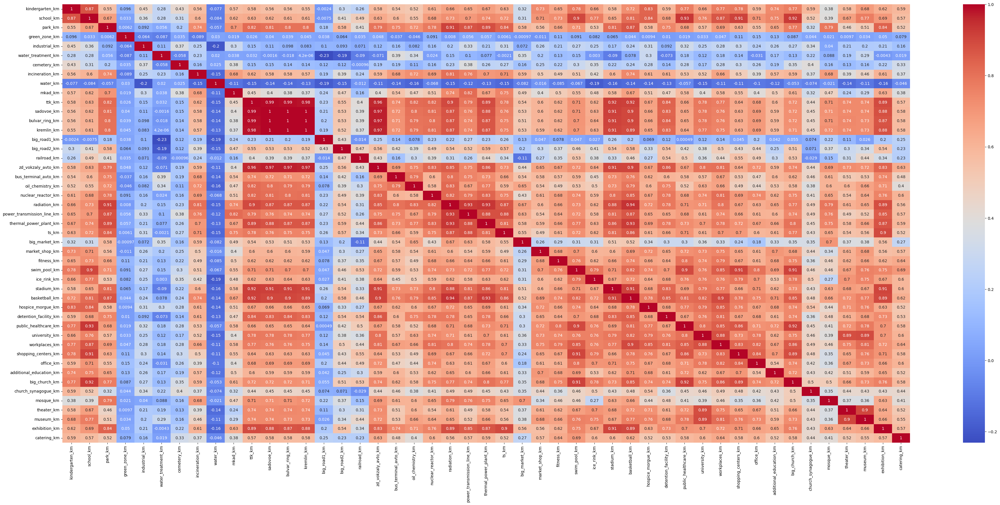

In [880]:
f, ax = plt.subplots(figsize=(48,20))

sns.heatmap(km.corr(), annot=True, cmap='coolwarm')

Information about distance to rings is dublicate. It will be better to have information about distance to center of city.

Drop: ttk_km, sadovoe_km, bulvar_ring_km 

In [882]:
ring_cols = ["ttk_km", "sadovoe_km", "bulvar_ring_km" ]

In [884]:
km.drop(columns=ring_cols, axis=1,inplace=True)

<AxesSubplot:>

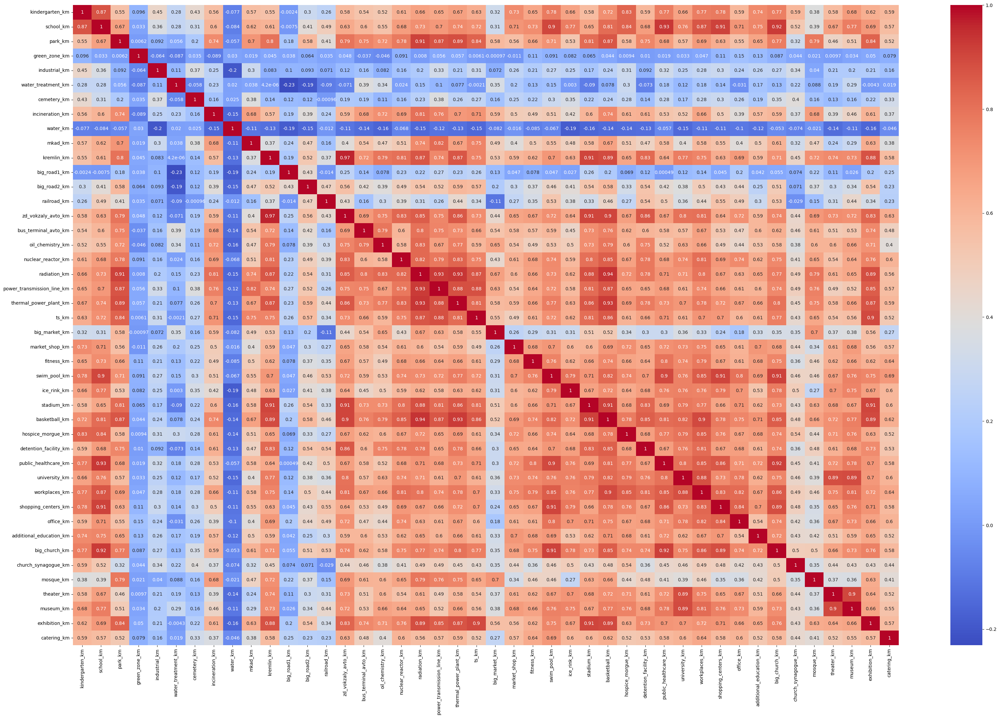

In [892]:
f, ax = plt.subplots(figsize=(40,25))

sns.heatmap(km.corr(), annot=True, cmap='coolwarm')

In [962]:
df.drop(columns=ring_cols, axis=1,inplace=True)

In [963]:
df.shape

(38133, 110)

In [964]:
df.to_csv('../3_step/sample2.csv', sep=';', index=False)